In [1]:
from PIL import Image
import requests
from io import BytesIO
from IPython.display import display
import numpy as np
from typing import Optional

import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

import random


RANDOM_SEED = 42


In [2]:
def download_img(url):
    headers = {
        "User-Agent": "Mozilla/5.0"
    }
    response = requests.get(url, headers=headers, allow_redirects=True)
    response.raise_for_status()  # Fehler anzeigen, falls z.B. 403/404
    return Image.open(BytesIO(response.content))

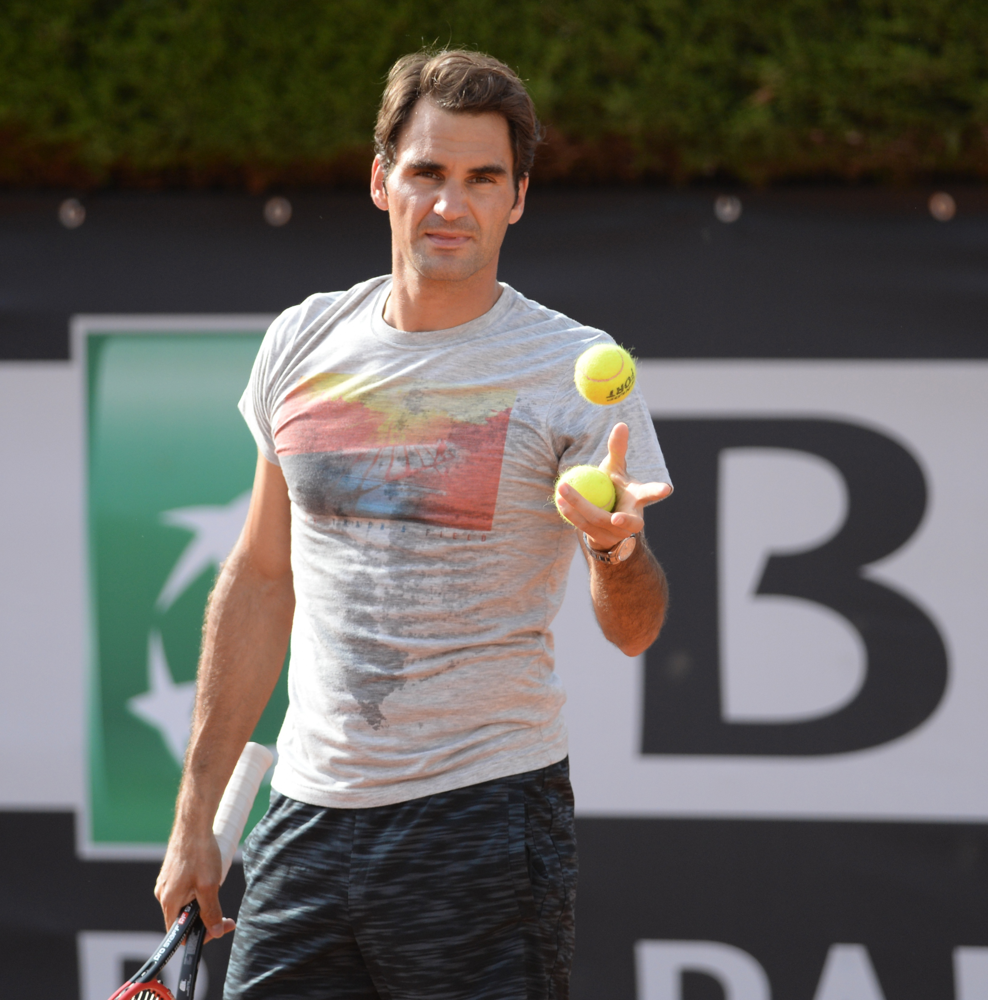

In [3]:
federer_img_url = "https://upload.wikimedia.org/wikipedia/commons/a/a6/Roger_Federer_%2819113580056%29.jpg"
federer_img = download_img(federer_img_url)
display(federer_img)

In [ ]:

#convert image to numpy array
federer_img = download_img(federer_img_url)
federer_arr = np.array(federer_img)   

federer_pixels = federer_arr.reshape((-1, 3))

print(f"Bildgrösse: {federer_arr.shape}")  # (height, width, 3)


Bildgrösse: (2804, 2773, 3)


In [ ]:
def rg_chromaticity(rgb):
    """
    rgb: Array der Form (N, 3) mit Werten 0–255
    Rückgabe: Array der Form (N, 2) mit (r, g)
    """
    rgb = rgb.astype(np.float32)
    s = np.sum(rgb, axis=1, keepdims=True)  
    s[s == 0] = 1.0                         
    rg = rgb[:, :2] / s                     
    return rg

In [6]:
def replace_nearest_color(image_arr, centers):
    """
    image_arr: (H, W, 3) uint8
    centers:   (K, 3) float oder uint8 (Clusterzentren)
    """
    h, w, c = image_arr.shape
    pixels = image_arr.reshape(-1, 3).astype(np.float32)
    centers = centers.astype(np.float32)

    # euklidische Distanz zu jedem Zentrum
    dists = np.linalg.norm(pixels[:, None, :] - centers[None, :, :], axis=2)
    labels = np.argmin(dists, axis=1)
    
    new_pixels = centers[labels].astype(np.uint8)
    return new_pixels.reshape(h, w, 3)

In [7]:
def arr2img(arr):
    return Image.fromarray(arr.astype(np.uint8))

Pixel-Matrix Grösse: (7775492, 3)
K=2: Inertia=19518567451.81, Silhouette Score=0.7218
K=3: Inertia=11017558456.74, Silhouette Score=0.6483
K=4: Inertia=8168449941.27, Silhouette Score=0.6462
K=5: Inertia=6463082768.96, Silhouette Score=0.6467
K=6: Inertia=5030865034.03, Silhouette Score=0.5442
K=7: Inertia=3864481731.69, Silhouette Score=0.5407
K=8: Inertia=3386820713.34, Silhouette Score=0.5387
K=9: Inertia=3028600826.77, Silhouette Score=0.5183
K=10: Inertia=2709840735.95, Silhouette Score=0.5278


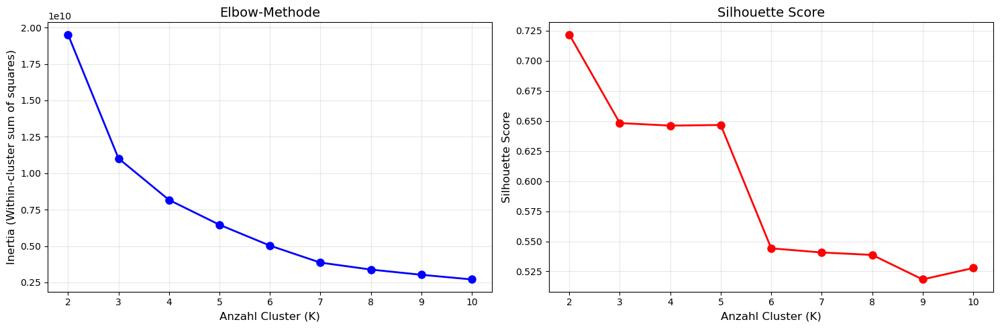

In [ ]:
# image from 3D to 2D for K-Means: (height, width, 3) -> (height*width, 3)

pixels = federer_arr.reshape((-1, 3))
print(f"Pixel-Matrix Grösse: {pixels.shape}")


#step 1: Find optimal K using Elbow Method and Silhouette Score
k_values = range(2, 11)
inertias = []
silhouette_scores_img = []

for k in k_values:
    kmeans_img = KMeans(n_clusters=k, random_state=RANDOM_SEED, n_init=10)
    kmeans_img.fit(pixels)
    inertias.append(kmeans_img.inertia_)
    score = silhouette_score(pixels, kmeans_img.labels_, sample_size=5000)  # sample für Geschwindigkeit
    silhouette_scores_img.append(score)
    print(f'K={k}: Inertia={kmeans_img.inertia_:.2f}, Silhouette Score={score:.4f}')

# Elbow-Plot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

ax1.plot(k_values, inertias, 'bo-', linewidth=2, markersize=8)
ax1.set_xlabel('Anzahl Cluster (K)', fontsize=12)
ax1.set_ylabel('Inertia (Within-cluster sum of squares)', fontsize=12)
ax1.set_title('Elbow-Methode', fontsize=14)
ax1.grid(True, alpha=0.3)
ax1.set_xticks(k_values)

ax2.plot(k_values, silhouette_scores_img, 'ro-', linewidth=2, markersize=8)
ax2.set_xlabel('Anzahl Cluster (K)', fontsize=12)
ax2.set_ylabel('Silhouette Score', fontsize=12)
ax2.set_title('Silhouette Score', fontsize=14)
ax2.grid(True, alpha=0.3)
ax2.set_xticks(k_values)

plt.tight_layout()
plt.show()

In [ ]:
# Schritt 2: Optimales K auswählen (z.B. K=8 als guter Kompromiss)
# Step 2: Select optimal K (e.g., K=8 as a good compromise)
optimal_k_img = 8

In [ ]:

# Step 3: Perform K-Means with optimal K
kmeans_final = KMeans(n_clusters=optimal_k_img, random_state=RANDOM_SEED, n_init=10)
kmeans_final.fit(pixels)

# Final cluster centers
centers_final = kmeans_final.cluster_centers_

print(f'\nFinal K: {optimal_k_img}')
print(f'Cluster centers shape: {centers_final.shape}')


Finales K: 8
Cluster-Zentren Shape: (8, 3)


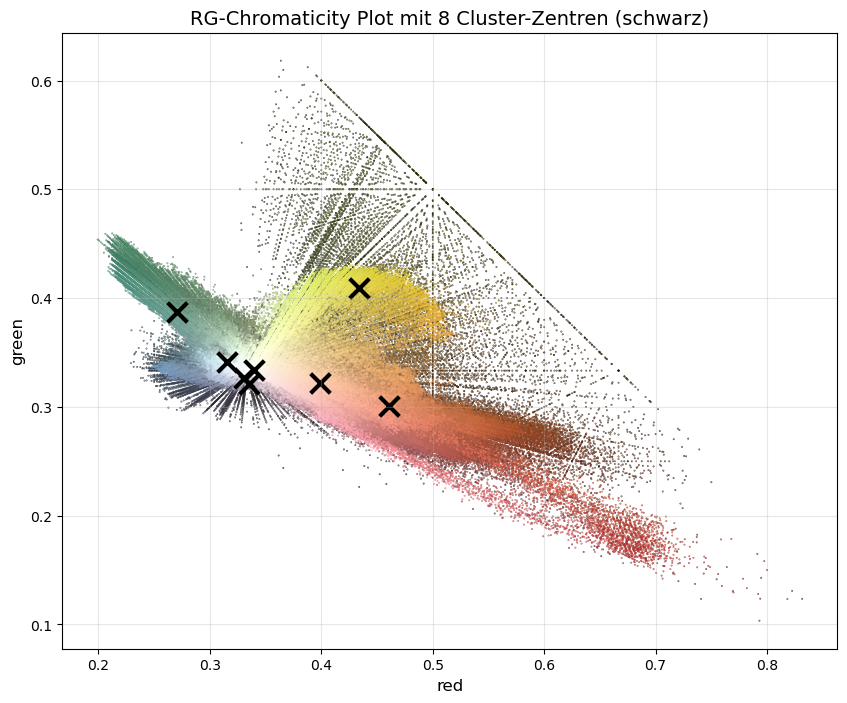

In [ ]:

# Step 4: Visualize cluster centers in RG-Chromaticity Space

colors = np.copy(federer_arr).reshape((-1, 3))

colors_unique = np.unique(colors, axis=0)


img_rg = rg_chromaticity(colors_unique)

colors_norm = colors_unique.astype(np.float32) / 255.0

plt.figure(figsize=(10, 8))
plt.scatter(
    img_rg[:, 0], img_rg[:, 1],
    c=colors_norm,
    s=0.1
)

# Add cluster centers
crg = rg_chromaticity(centers_final)
plt.scatter(crg[:, 0], crg[:, 1], c="black", marker="x", s=200, linewidths=3)

plt.xlabel("red", fontsize=12)
plt.ylabel("green", fontsize=12)
plt.title(f'RG-Chromaticity Plot mit {optimal_k_img} Cluster-Zentren (schwarz)', fontsize=14)
plt.grid(True, alpha=0.3)
plt.show()



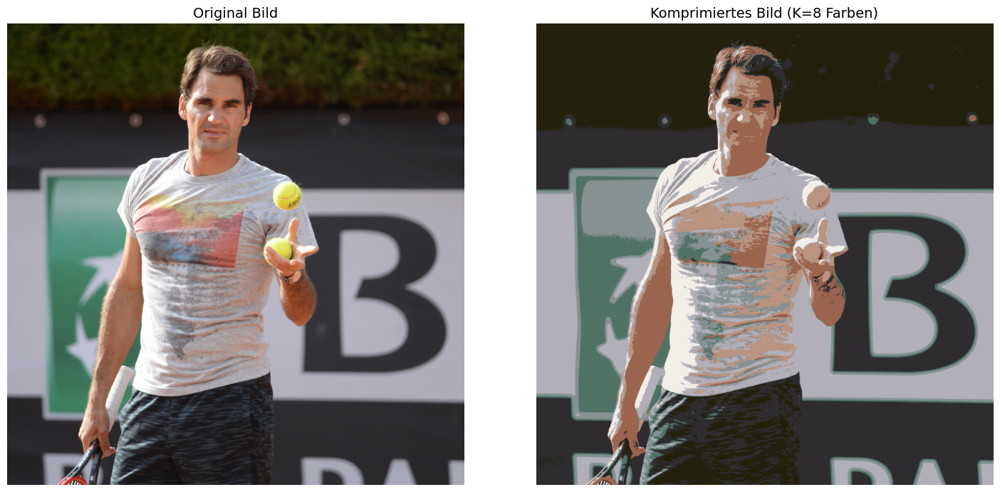


Compressed Image:


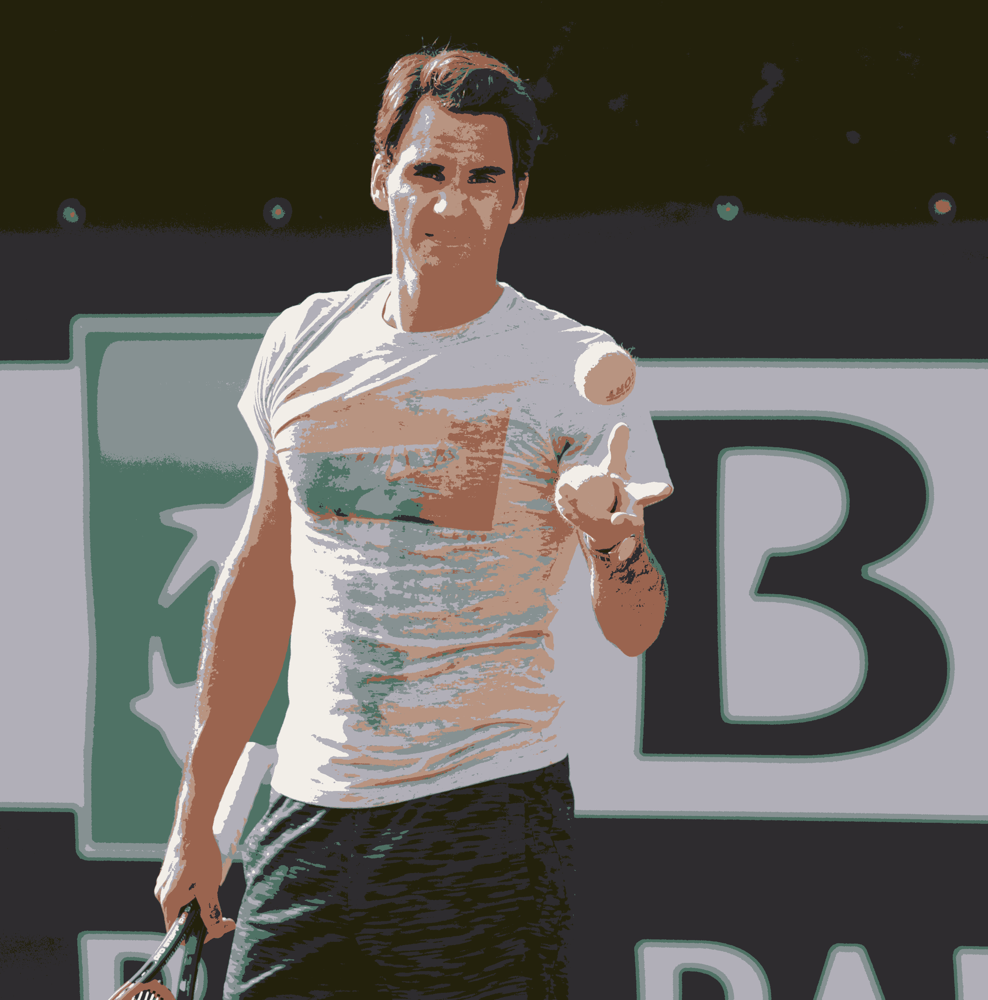

In [14]:
# Step 5: Replace colors in image with nearest cluster centers
img_compressed = replace_nearest_color(federer_arr, centers_final)

# step 6: Compare original vs. compressed image
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 7))

ax1.imshow(federer_arr)
ax1.set_title('Original Bild', fontsize=14)
ax1.axis('off')

ax2.imshow(img_compressed)
ax2.set_title(f'Komprimiertes Bild (K={optimal_k_img} Farben)', fontsize=14)
ax2.axis('off')

plt.tight_layout()
plt.show()

# Display images“
print("\nCompressed Image:")
display(arr2img(img_compressed))
